In [ ]:
import torch
# torch.autograd.set_detect_anomaly(True)
from torch.utils.data import DataLoader,WeightedRandomSampler
from torch.optim.lr_scheduler import PolynomialLR
import torch.nn.functional as F
from torchvision.transforms import v2

import albumentations as A
from albumentations.pytorch import ToTensorV2
import segmentation_models_pytorch as smp

from tqdm.notebook import tqdm
import json
import cv2
import matplotlib.pyplot as plt
import numpy as np
import random
import os
###IE###
%load_ext autoreload
%autoreload 2
from utils.helpers import (
    plot_some_images ,read_images ,
    pre_hard_skeletonize , pre_soft_skeletonize,
    compute_confution_matrix,draw_mask,TP_TN_FP_FN,)
from utils.preprocessing import (
    WhiteTopHat , CLAHE , normalize_xca,
    BrightnessMultiplicativeNNUNet2D,
    ContrastAugmentationNNUNet2D)
from utils.dataset import  (
    TrainUnetDataset  
)
from models.nnunet import nnUnet
from models.memory_unet import MemoryUnet
from utils.losses import UnetLoss
from utils.recorder import HistoryRecorder
from logger import save_full_report
from trainer import trainer
###SS###
from trainer import evaluation

In [ ]:
args = {
    "base_path" : "./dataset/syntax/",
    "memory_unet":{
        "layer_count":4,
        "channel_max":256,
        "downsampling":"maxpool",
        "normaliztion":"InstanceNorm2d",
        "activation" : "LeakyReLU",
        "first_layer_out_c" : 64
    },
    "image_shape" : (448,448),
    "in_c":1,
    
    "training_mode":"binary",
    "report_class_wise":True,
    "attention" : False,
    "batch_size" : 8,
    "num_workers" : 5,
    "device" : "cuda" if torch.cuda.is_available() else "cpu",
    "epcohs":10,
    "f_int_scale" : 2,
    "full_report_cycle" : 1,
    "max_channels":512,
    "loss_type":"tversky",
    "output_base_path" : "./outputs",
    "name" : "binary-tests-normalization",
    "deep_super_vision" : False,
    "mask_ce_weights":None,
    "layer_count":5,
    ### Loss Functions
    "mask_ce_conf":{
        "imp_coef":1.0
    },
    "focal_ce_conf":{
        "gamma":2.0,
        "loss_scale":1.0,
        "imp_coef":1.0
    },
    "tversky_conf":{
        "alpha":0.1,
        "beta":0.9,
        "gamma":2.00,
        "weights":None,
        "imp_coef":1.0
    },
    "cl_dice_conf":{
        "imp_coef":1.0,
        "k":40
    },
    ### Optimizers
    "sgd_conf":{
        "lr" : 0.1,
        "momentum" : 0.99,
        "weight_decay" : 3e-5,
        "nesterov":True
    },
    "adam_conf":{
        "lr" : 0.01,
        "weight_decay" : 3e-5,
    }
}
if(args["training_mode"] == "binary"):
    args["class_count"] = 2 
    class_map = {
        1:"fg"
    }

else:
    args["class_count"] = 26
    class_map = {
        1: '1',2: '2', 3: '3',4: '4',
        5: '5',6: '6',7:'9',8:'7',9:'9a',
        10:'10',11:'8',12:'10a',13:'12',14:'11',
        15:'12a',16:'12b',17:'13',18:'14',19:'14a',
        20:'14b',21:'15',22:'16',
        23: '16a',24: '16b',25: '16c',
    }

# losses_keys = ["total loss","FCE loss",args["loss_type"]]
losses_keys = ["total loss","mask CE-Loss",args["loss_type"],"cl dice loss"]
out_counts = args["layer_count"] if args["deep_super_vision"] else 1
loss_weights = [1/(2**i) for i in range(out_counts)]
loss_weights



[1.0]

In [ ]:
if(args["training_mode"]!="binary"):
    b=0.999

    train_class_counts = [
        1200,374,375,369,303,525,537,
        198,340,70,21,310,1,61,320,129,
        63,305,107,49,127,38,232,43,48,31
    ]

    total = np.sum(train_class_counts)
    mask_ce_weights = np.log(total/np.array(train_class_counts))
    mask_ce_weights = (mask_ce_weights / mask_ce_weights.mean()).tolist()
    mask_ce_weights[0]=0.1

    args["mask_ce_weights"]=mask_ce_weights
    args["mask_ce_weights"]
else:
    args["mask_ce_weights"]=[0.1,1]

In [ ]:
# args["t_alpha"] = [1,0.8]
args["tversky_conf"]["t_alpha"] = None

In [ ]:
train_transforms = A.Compose([
    A.Resize(*args["image_shape"]),
    A.Downscale(
        scale_range=[0.7, 1],
        interpolation_pair={"downscale": 0, "upscale": 0},
        p=0.5
    ),
    A.GaussNoise(
        std_range=[0.0, 0.1],
        mean_range=[0, 0],
        per_channel=True,
        noise_scale_factor=1,
        p=0.5
    ),
    A.GaussianBlur(
        sigma_limit=[1.0,1.5],
        blur_limit = (3,7),
        p=0.5
    ),

    A.OneOf([
        A.ElasticTransform(
            alpha=120, 
            sigma=120 * 0.05, 
            p=1.0
        ),
        A.GridDistortion(num_steps=5, distort_limit=0.3, p=1.0),
        A.OpticalDistortion(distort_limit=0.2, p=1.0),
    ], p=0.5),
    A.Compose([
        A.InvertImg(p=1.0),
        A.RandomGamma(gamma_limit=(70, 150), p=1.0),
        A.InvertImg(p=1.0),
    ], p=0.5),
    BrightnessMultiplicativeNNUNet2D(multiplier_range=(0.70, 1.3), p=0.5),
    ContrastAugmentationNNUNet2D(contrast_range=(0.65, 1.5), p=0.5),
    A.RandomGamma(
        gamma_limit=(90, 120), 
        p=0.5
    ),
    A.Affine(
        scale=(0.7, 1.4),  
        translate_percent=(0, 0),
        rotate=0,               
        shear=0,                 
        fit_output=False, 
        p=0.5
    ),
    A.Rotate(limit=30, p=0.5, fill_mask = 0),
    A.Rotate(limit=-30, p=0.5, fill_mask = 0),
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),

    ]
)
test_transforms = A.Compose([
    A.Resize(*args["image_shape"]),
    ]  
)

if(args["in_c"]==1):
    normalizer = normalize_xca
else:
    normalizer = A.Normalize(
        mean=(0.485, 0.456, 0.406),
        std=(0.229, 0.224, 0.225),
        max_pixel_value=255.0,
    )
train_preprocess = None


/home/parsa/Masters/Coronary Artry/Datasets/Arcade/codes/utils/preprocessing.py:54: UserWarning: Argument(s) 'always_apply' are not valid for transform BasicTransform
  super().__init__(always_apply=always_apply, p=p)
/home/parsa/Masters/Coronary Artry/Datasets/Arcade/codes/utils/preprocessing.py:67: UserWarning: Argument(s) 'always_apply' are not valid for transform BasicTransform
  super().__init__(always_apply=always_apply, p=p)


In [ ]:
train_images = read_images(base_path = args["base_path"],preprocessor = train_preprocess,part = "train",chosen_labels=[19,25])
valid_images = read_images(base_path = args["base_path"],preprocessor = train_preprocess,part = "val",chosen_labels=[19,25])


NOTE : preprocessor is not defined . no preprocessing will be used !


  0%|          | 0/1000 [00:00<?, ?it/s]

NOTE : preprocessor is not defined . no preprocessing will be used !


  0%|          | 0/200 [00:00<?, ?it/s]

In [ ]:

train_ds = TrainUnetDataset(
    transform = train_transforms,
    data = train_images , 
    normalizer = normalizer,
    example_phase=False
)
valid_ds = TrainUnetDataset(
    transform = test_transforms,
    data = valid_images,
    normalizer = normalizer,
    example_phase=False
)
# sampler = WeightedRandomSampler(
#     weights=sampler_weights, 
#     num_samples=len(sampler_weights),
#     replacement=True)

train_loader = DataLoader(
    train_ds,
    batch_size = args["batch_size"] ,
    num_workers = args["num_workers"] ,
    pin_memory=True,
    shuffle=True
    # sampler=sampler
)
valid_loader = DataLoader(
    valid_ds,
    batch_size = args["batch_size"]  ,
    num_workers = args["num_workers"] ,
    pin_memory=True,
    shuffle=False
)


In [ ]:

# model = nnUnet(args).to(args["device"])
model = MemoryUnet(args).to(args["device"])

loss_fn = UnetLoss(args)
# optimizer = torch.optim.Adam(
#     model.parameters(), 
#     **args["adam_conf"]
# )
optimizer = torch.optim.SGD(
    model.parameters(),
    **args["sgd_conf"]
)
# optimizer = torch.optim.AdamW(model.parameters(), lr=1e-4, weight_decay=1e-2)
# lr_sch = PolynomialLR(optimizer=optimizer,total_iters=args["epcohs"],power=0.9)
lr_sch = None
recorder = HistoryRecorder(losses_keys=losses_keys,class_maps =class_map,class_count=args["class_count"]-1)


best_model = trainer(
    args=args,
    recorder = recorder,
    model = model,
    optimizer = optimizer,
    loss_fn = loss_fn,
    train_loader = train_loader,
    valid_loader = valid_loader,
    loss_weights=loss_weights,
    lr_sch = lr_sch
)
# best_model = model


encoder info : 
[1, 64, 128, 256, 256]
-----------------------
loss is set to tversky


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (0)
total loss : 1.105367691040039 - mask CE-Loss : 0.3624579076766968 - tversky : 0.1909104341864586
cl dice loss : 0.5519993467330933 - 
train avg metrics for epoch 0 :
avg dice : 0.39599624276161194 - avg precision : 0.27276214957237244 - avg recall : 0.7223581075668335
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (0)
total loss : 0.8300937175750732 - mask CE-Loss : 0.27472688794136046 - tversky : 0.09178545117378235
cl dice loss : 0.46358137369155883 - 
valid avg metrics for epoch 0 :
avg dice : 0.4743225872516632 - avg precision : 0.3279823362827301 - avg recall : 0.8564612865447998
fg => dice : 0.4743225872516632 p : 0.3279823362827301 , r : 0.8564612865447998
------------------------------------------------------------
New Best! : dice = 0.4743225872516632


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (1)
total loss : 0.7912142715454101 - mask CE-Loss : 0.2660600470304489 - tversky : 0.10189765092730522
cl dice loss : 0.4232565727233887 - 
train avg metrics for epoch 1 :
avg dice : 0.5091341137886047 - avg precision : 0.3703705072402954 - avg recall : 0.8141737580299377
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (1)
total loss : 0.7462019872665405 - mask CE-Loss : 0.2684620159864426 - tversky : 0.08668419912457466
cl dice loss : 0.3910557794570923 - 
valid avg metrics for epoch 1 :
avg dice : 0.5273808240890503 - avg precision : 0.3881988823413849 - avg recall : 0.8221472501754761
fg => dice : 0.5273808240890503 p : 0.3881988823413849 , r : 0.8221472501754761
------------------------------------------------------------
New Best! : dice = 0.5273808240890503


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (2)
total loss : 0.7361394538879394 - mask CE-Loss : 0.24599620354175566 - tversky : 0.08980556160211563
cl dice loss : 0.4003376874923706 - 
train avg metrics for epoch 2 :
avg dice : 0.5226545929908752 - avg precision : 0.38068196177482605 - avg recall : 0.8335040807723999
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (2)
total loss : 0.6530148315429688 - mask CE-Loss : 0.2115516769886017 - tversky : 0.08025330752134323
cl dice loss : 0.3612098479270935 - 
valid avg metrics for epoch 2 :
avg dice : 0.5448070168495178 - avg precision : 0.3982449173927307 - avg recall : 0.8620638251304626
fg => dice : 0.5448070168495178 p : 0.3982449173927307 , r : 0.8620638251304626
------------------------------------------------------------
New Best! : dice = 0.5448070168495178


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (3)
total loss : 0.6987666058540344 - mask CE-Loss : 0.23319092416763307 - tversky : 0.08446300810575486
cl dice loss : 0.38111267518997194 - 
train avg metrics for epoch 3 :
avg dice : 0.5392159819602966 - avg precision : 0.3974135220050812 - avg recall : 0.838350772857666
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (3)
total loss : 0.6577550315856934 - mask CE-Loss : 0.22299651563167572 - tversky : 0.07201677113771439
cl dice loss : 0.36274174451828 - 
valid avg metrics for epoch 3 :
avg dice : 0.5305595993995667 - avg precision : 0.3818512260913849 - avg recall : 0.8689729571342468
fg => dice : 0.5305595993995667 p : 0.3818512260913849 , r : 0.8689729571342468
------------------------------------------------------------


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (4)
total loss : 0.6732907829284668 - mask CE-Loss : 0.22578972816467285 - tversky : 0.0783520608842373
cl dice loss : 0.3691489925384521 - 
train avg metrics for epoch 4 :
avg dice : 0.5428450107574463 - avg precision : 0.3990364968776703 - avg recall : 0.8487118482589722
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (4)
total loss : 0.6550245618820191 - mask CE-Loss : 0.23102979779243468 - tversky : 0.07561471238732338
cl dice loss : 0.3483800506591797 - 
valid avg metrics for epoch 4 :
avg dice : 0.5645766258239746 - avg precision : 0.42553722858428955 - avg recall : 0.8385696411132812
fg => dice : 0.5645766258239746 p : 0.42553722858428955 , r : 0.8385696411132812
------------------------------------------------------------
New Best! : dice = 0.5645766258239746


  0%|          | 0/125 [00:00<?, ?it/s]

--- Total Norm ---
tensor(0.1667, device='cuda:0')
----------------------

current lr : 0.1
train ==> epcoh (5)
total loss : 0.6485623021125794 - mask CE-Loss : 0.21652006006240845 - tversky : 0.07324380645155906
cl dice loss : 0.35879843282699586 - 
train avg metrics for epoch 5 :
avg dice : 0.5591382384300232 - avg precision : 0.41620609164237976 - avg recall : 0.8515880703926086
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (5)
total loss : 0.6093743371963501 - mask CE-Loss : 0.2110609543323517 - tversky : 0.06654963791370391
cl dice loss : 0.33176374673843384 - 
valid avg metrics for epoch 5 :
avg dice : 0.5687926411628723 - avg precision : 0.4246942400932312 - avg recall : 0.8608928322792053
fg => dice : 0.5687926411628723 p : 0.4246942400932312 , r : 0.8608928322792053
------------------------------------------------------------
New Best! : dice = 0.5687926411628723


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (6)
total loss : 0.6288938896656037 - mask CE-Loss : 0.21141707468032836 - tversky : 0.0696807756125927
cl dice loss : 0.3477960410118103 - 
train avg metrics for epoch 6 :
avg dice : 0.5666828155517578 - avg precision : 0.4235790967941284 - avg recall : 0.8558148145675659
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (6)
total loss : 0.5888622891902924 - mask CE-Loss : 0.18391335099935532 - tversky : 0.07269447043538094
cl dice loss : 0.3322544741630554 - 
valid avg metrics for epoch 6 :
avg dice : 0.6059277653694153 - avg precision : 0.4659772515296936 - avg recall : 0.8660287857055664
fg => dice : 0.6059277653694153 p : 0.4659772515296936 , r : 0.8660287857055664
------------------------------------------------------------
New Best! : dice = 0.6059277653694153


  0%|          | 0/125 [00:00<?, ?it/s]

--- Total Norm ---
tensor(0.1439, device='cuda:0')
----------------------

current lr : 0.1
train ==> epcoh (7)
total loss : 0.6095990235805512 - mask CE-Loss : 0.20412361204624177 - tversky : 0.06694874116778374
cl dice loss : 0.3385266680717468 - 
train avg metrics for epoch 7 :
avg dice : 0.5775547027587891 - avg precision : 0.4350152015686035 - avg recall : 0.8590288758277893
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (7)
total loss : 0.6001187515258789 - mask CE-Loss : 0.20179200291633606 - tversky : 0.0662677389383316
cl dice loss : 0.33205901384353637 - 
valid avg metrics for epoch 7 :
avg dice : 0.6023200750350952 - avg precision : 0.46534493565559387 - avg recall : 0.8535699844360352
fg => dice : 0.6023200750350952 p : 0.46534493565559387 , r : 0.8535699844360352
------------------------------------------------------------


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (8)
total loss : 0.6044584379196167 - mask CE-Loss : 0.20478254282474517 - tversky : 0.06427831694483757
cl dice loss : 0.33539757823944094 - 
train avg metrics for epoch 8 :
avg dice : 0.5838270783424377 - avg precision : 0.4423532783985138 - avg recall : 0.8583431839942932
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (8)
total loss : 0.564850445985794 - mask CE-Loss : 0.18591442942619324 - tversky : 0.057154396921396254
cl dice loss : 0.3217816162109375 - 
valid avg metrics for epoch 8 :
avg dice : 0.5784045457839966 - avg precision : 0.42982929944992065 - avg recall : 0.8839524388313293
fg => dice : 0.5784045457839966 p : 0.42982929944992065 , r : 0.8839524388313293
------------------------------------------------------------


  0%|          | 0/125 [00:00<?, ?it/s]

--- Total Norm ---
tensor(0.3803, device='cuda:0')
----------------------

--- Total Norm ---
tensor(0.2247, device='cuda:0')
----------------------

current lr : 0.1
train ==> epcoh (9)
total loss : 0.5843889195919036 - mask CE-Loss : 0.19575136452913283 - tversky : 0.06165174272656441
cl dice loss : 0.3269858121871948 - 
train avg metrics for epoch 9 :
avg dice : 0.5879904627799988 - avg precision : 0.44526612758636475 - avg recall : 0.8653751611709595
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (9)
total loss : 0.5758113837242127 - mask CE-Loss : 0.2048168283700943 - tversky : 0.05727231487631798
cl dice loss : 0.3137222409248352 - 
valid avg metrics for epoch 9 :
avg dice : 0.5870129466056824 - avg precision : 0.4444025754928589 - avg recall : 0.8644030094146729
fg => dice : 0.5870129466056824 p : 0.4444025754928589 , r : 0.8644030094146729
------------------------------------------------------------
best result at epoch 7 with dice 0.60592776536941

Save Model
Saving Memory
Saving All Plots


  0%|          | 0/25 [00:00<?, ?it/s]

Saving Examples


  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

Saving Verbal Results
Copying Notebook To Results
builfding kaggle project


100%|██████████| 12/12 [00:00<00:00, 3342.52it/s]


processing ./utils/dataset.py
processing ./utils/helpers.py
processing ./logger.py
processing ./utils/preprocessing.py
processing ./utils/recorder.py
processing ./models/costume_nnunet_blocks.py
processing ./models/nnunet.py
processing ./models/swin_encoder.py
processing ./models/swin_blocks.py
processing ./models/conv_lstm.py
processing ./utils/losses.py
processing ./trainer.py


100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


processing ./temp_script.py


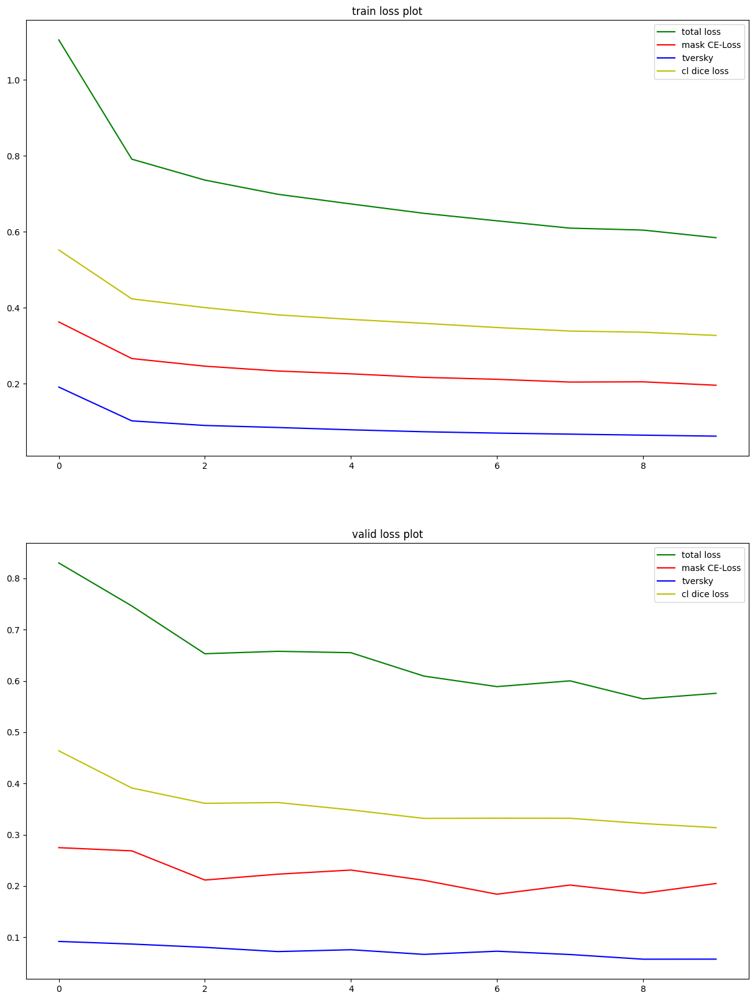

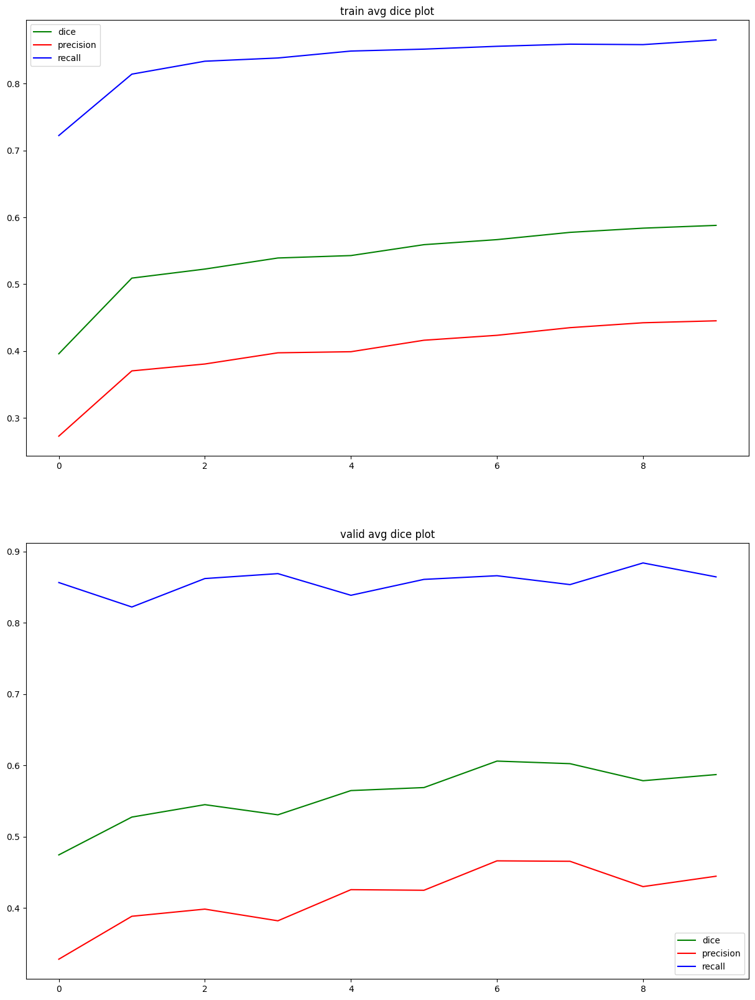

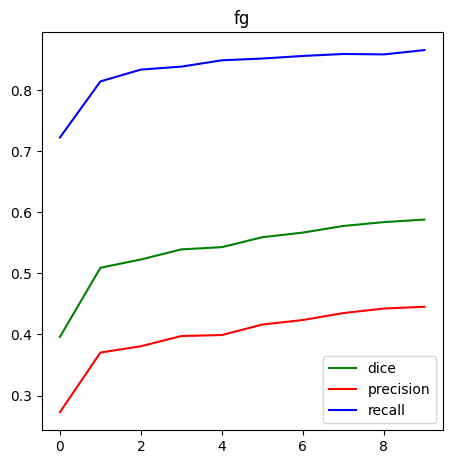

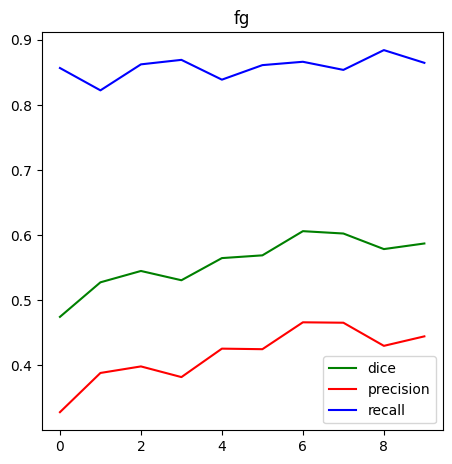

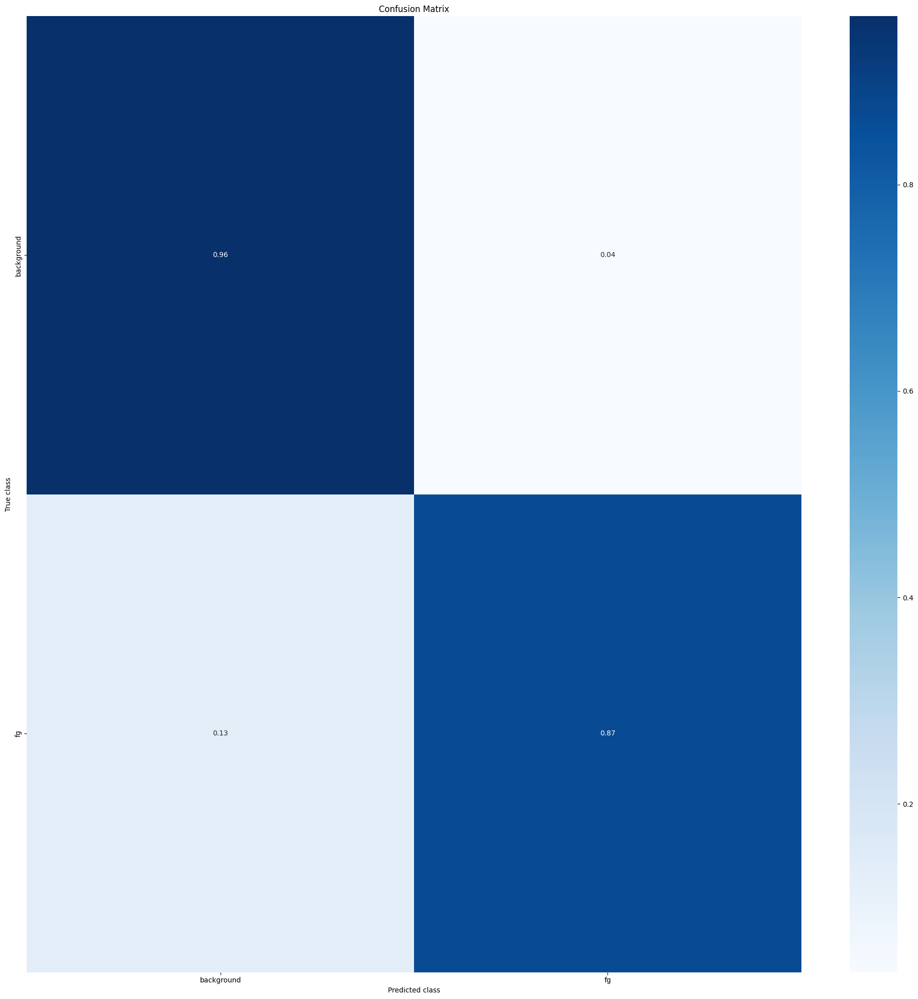

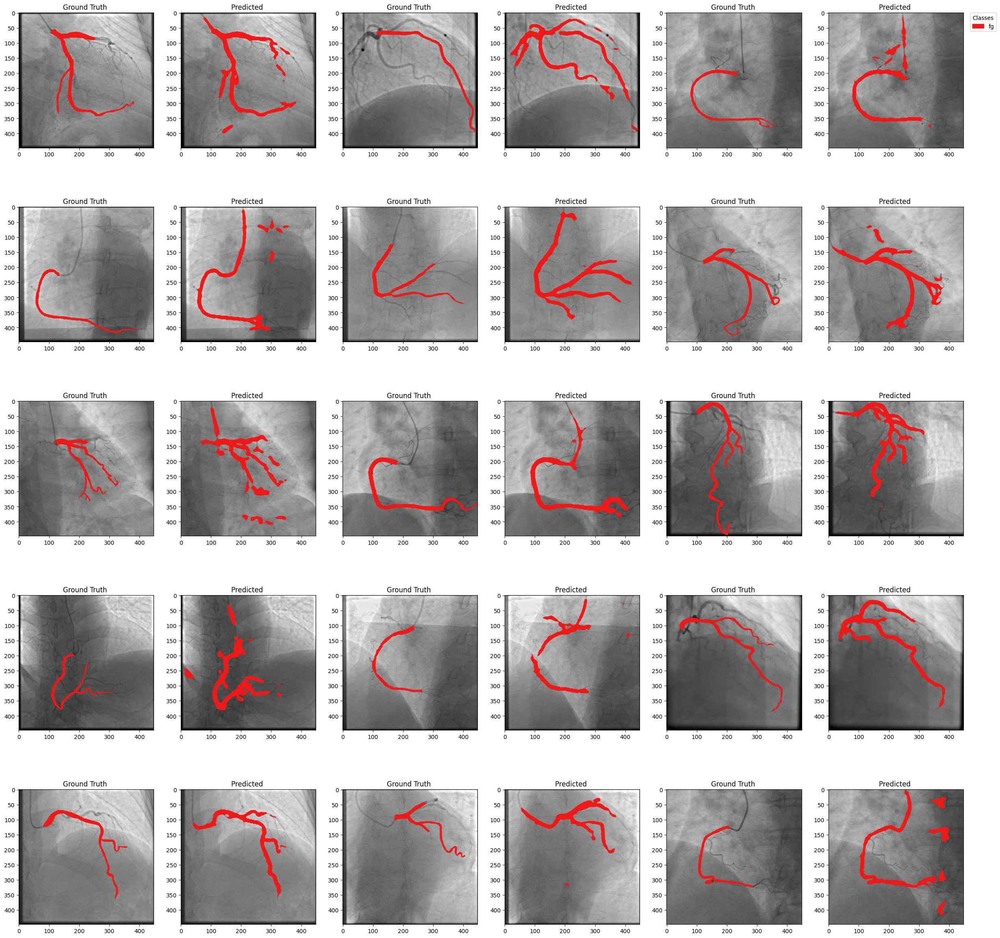

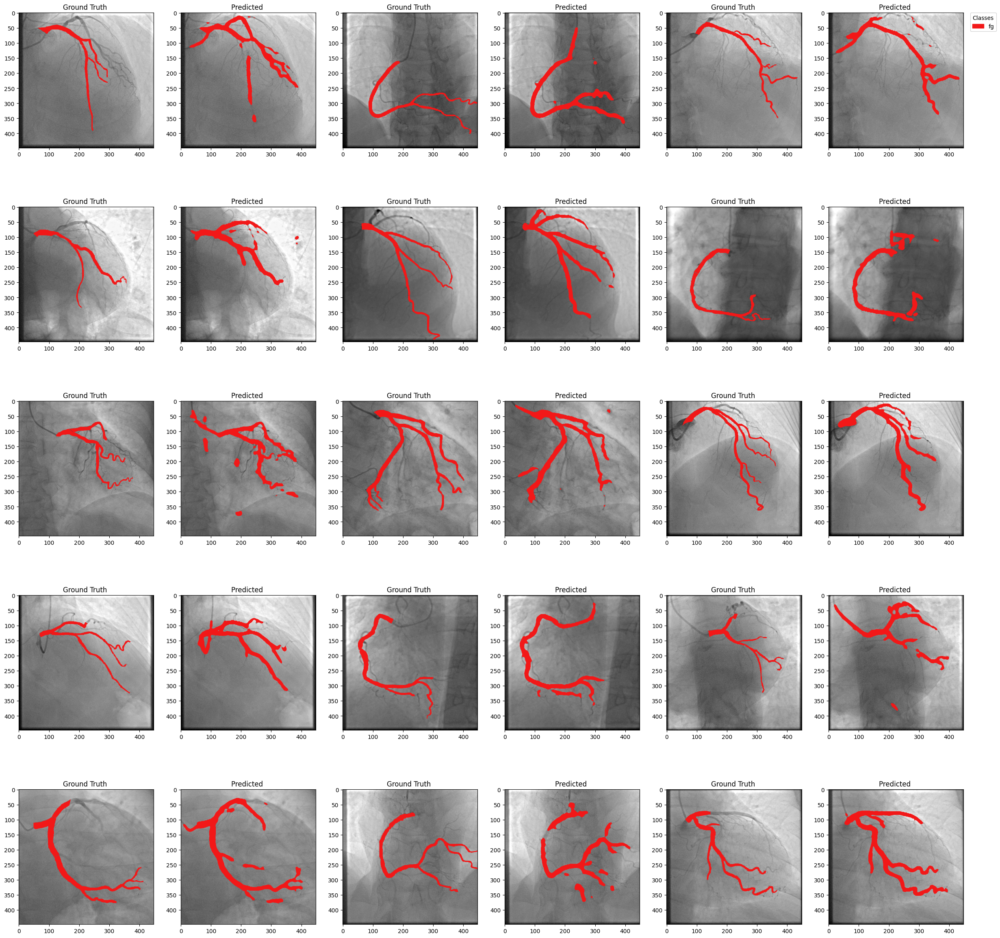

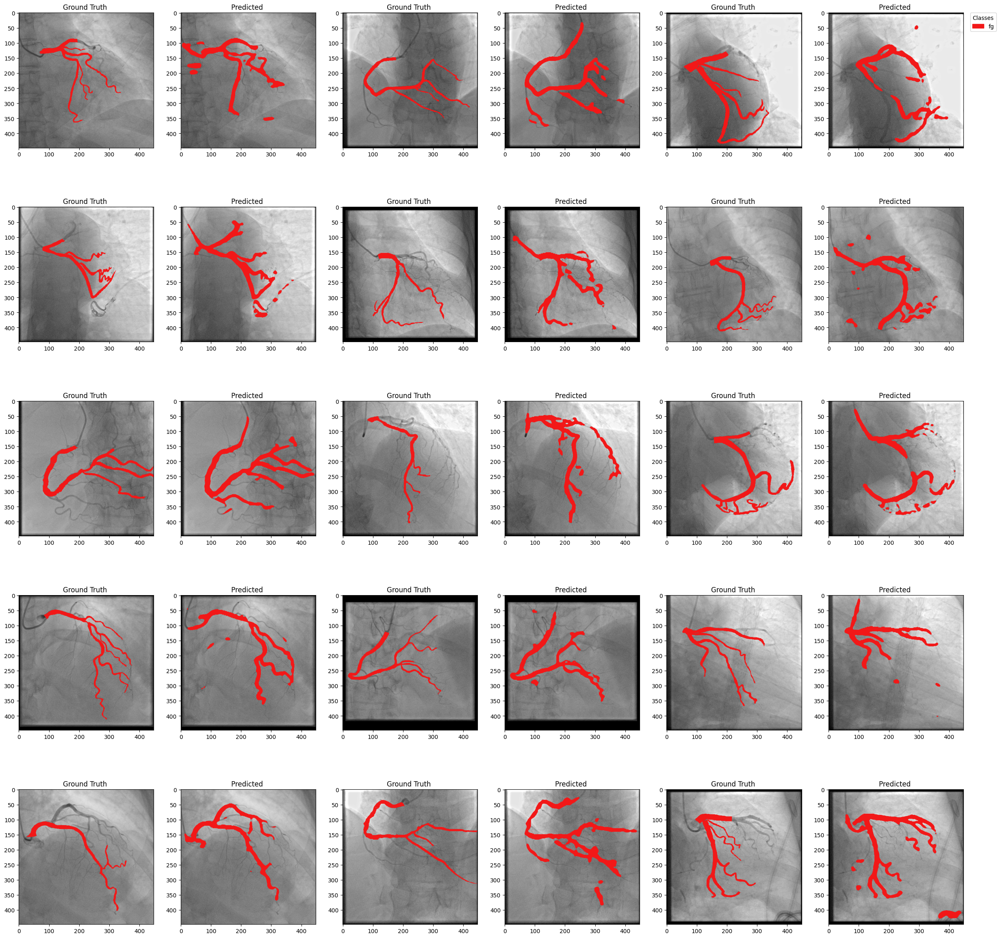

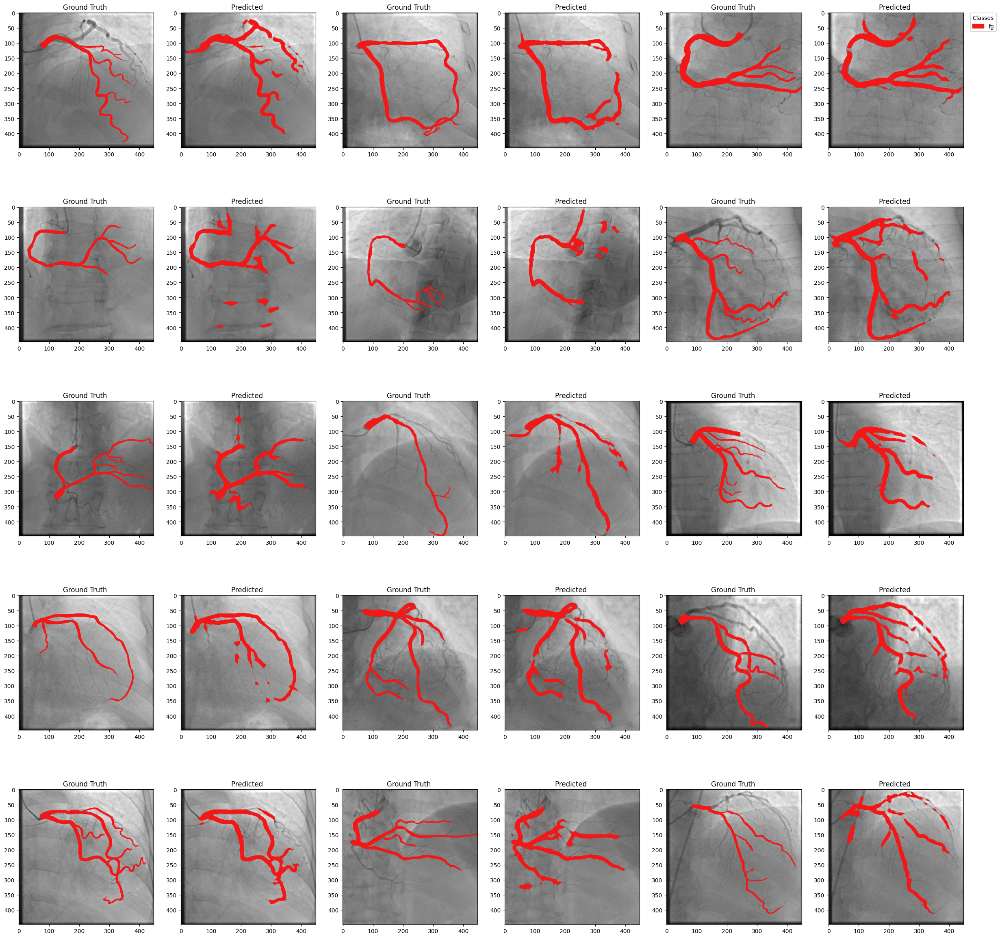

In [ ]:
save_full_report(
    recorder= recorder , 
    output_base_path=args["output_base_path"],
    model=best_model,
    valid_loader=valid_loader,
    normalizer = normalizer,
    args=args,
    class_map=class_map,
    name=args["name"],
    valid_images = valid_images,
    test_transforms = test_transforms,
    notebook_name = "Multi_Main.ipynb",
    class_count = args["class_count"],
    device = args["device"],
    training_mode = args["training_mode"]
)